In [1]:
import anndata as ad
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import anndata as ad

import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
import seaborn as sns

from bin import load_bgi as ld
from tqdm import tqdm

In [2]:
fdata = ld.load_bin(gem_file="gRNA/B926/cut.combined.D03658A6.merged.sgRNA.gem",
                    bin_size=20,
                    library_id="gRNA")

In [3]:
bin20data = fdata.copy()

In [6]:
T_marker = {
  'CD8-T':['Cd8a','Cd8b1'],
  'CD4-T':['Cd4'],
  "naive-T": ['Cd4','Cd8a','Cd8b1',"Ccr7", "Tcf7", "Lef1", "Sell",'Fhit', "Klf2"],
  "memory-T": ['Cd4','Cd8a','Cd8b1', "Cd27", 'Ccr4','Eomes','Gpr183'], 
  "effector-CD8T":['Cd8b1', 'Gzmk', 'Fcgr3', 'Klrd1', 'Cd69', 'Klrg1', 'Nkg7', 'Prf1', 'Gzmb', 'Cd244', 'Gpr183', 'Ifng', 'Cx3cr1', 'Gzma', 'Plek', 'Hopx', 'Cd8a'],
  "exhausted-CD8T":['Cd8a','Cd8b1', "Lag3", "Pdcd1", "Tigit", "Ctla4", 'Tox','Tnfrsf9','Tnfrsf18',  'Cxcr6', 'Cxcl13'],
  "Tfh":['Tnfrsf18', 'Bcl6', 'Smco4', 'Nr3c1',  'Lag3', 'Tox', 'Cxcl13', 'Tigit', 'Cd4', 'Cxcr5', 'Nmb', 'Cd200', 'Icos', 'Btla', 'Gng4', 'Pdcd1', 'Tnfrsf4', 'Sh2d1a'],
  "Treg": ['Entpd1', 'Tnfrsf18', 'Gbp5', 'Tnfrsf1b', 'Layn', 'Ctla4', 'Cd27', 'Rtkn2', 'Il1r2', 'Dusp4', 'Ikzf2', 'Tigit', 'Batf', 'Cd4', 'Foxp3', 'Icos', 'Tnfrsf4', 'Tnfrsf9', 'Gbp2', 'Il2rb', 'Il2ra'],
  'TH17':['Cd4','Il17f','Rorc']
}

In [78]:
T_marker = {
    "naive T": ["Ccr7", "Tcf7", "Lef1", "Sell", "Klf2"],
    "memory T": ["Il7r", "Cd27", "Timp1"],
    "Tcm": ["Ccr7", "Sell"],
    "Tem": ["Eomes", "Gzmk"],
    "Trm": ["Cd69", "Itgae", "Xcl1", "Zfp683", "Klf2", "S1pr1"],
    "Temra": ["Tbx21", "Gzmb", "Nkg7"],
    "effector T": ["Gzmk", "Gzma", "Gzmb", "Prf1", "Nkg7"],
    "exhausted T": ["Havcr2", "Lag3", "Entpd1", "Tigit", "Ctla4", "Layn"],
    "stem-like T": ["Tcf7"]
}

In [5]:
fdata = ad.read_h5ad("./RNA/Multitime_sorted.h5")
cdata = ad.read_h5ad("./RNA/Multitime.fixed.guide.h5")

In [97]:
rnadata = bin20data[:, ~np.isin(bin20data.var_names, guide_gene)].copy()

In [169]:
for path, genes in tqdm(T_marker.items()):
    print(genes)
    #sc.tl.score_genes(rnadata, gene_list=genes, score_name=f"{path}_score")
    rnadata.obs[f"{path}_score"] = rnadata[:, genes].X.mean(axis=1).reshape(1, -1).tolist()[0]

  0%|          | 0/9 [00:00<?, ?it/s]

['Ccr7', 'Tcf7', 'Lef1', 'Sell', 'Klf2']


 11%|█         | 1/9 [00:00<00:03,  2.40it/s]

['Il7r', 'Cd27', 'Timp1']


 22%|██▏       | 2/9 [00:00<00:02,  2.37it/s]

['Ccr7', 'Sell']


 33%|███▎      | 3/9 [00:01<00:02,  2.45it/s]

['Eomes', 'Gzmk']


 44%|████▍     | 4/9 [00:01<00:01,  2.53it/s]

['Cd69', 'Itgae', 'Xcl1', 'Zfp683', 'Klf2', 'S1pr1']


 56%|█████▌    | 5/9 [00:01<00:01,  2.67it/s]

['Tbx21', 'Gzmb', 'Nkg7']


 67%|██████▋   | 6/9 [00:02<00:01,  2.93it/s]

['Gzmk', 'Gzma', 'Gzmb', 'Prf1', 'Nkg7']


 78%|███████▊  | 7/9 [00:02<00:00,  3.16it/s]

['Havcr2', 'Lag3', 'Entpd1', 'Tigit', 'Ctla4', 'Layn']


 89%|████████▉ | 8/9 [00:02<00:00,  3.34it/s]

['Tcf7']


100%|██████████| 9/9 [00:03<00:00,  3.00it/s]


In [181]:
rnadata.obs

,naive T_score,memory T_score,Tcm_score,Tem_score,Trm_score,Temra_score,effector T_score,exhausted T_score,stem-like T_score,spatial,cluster,t_state
258071,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(5600, 400)",6.0,no T
163107,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(3600, 600)",6.0,no T
171176,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,"(3800, 600)",6.0,no T
125484,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(2800, 800)",3.0,no T
161327,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,"(3600, 800)",6.0,no T
...,...,...,...,...,...,...,...,...,...,...,...,...
93199,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(2000, 200)",NaN,no T
104847,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(2200, 200)",NaN,no T
18862,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(400, 800)",NaN,no T
9282,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(200, 6400)",NaN,no T


In [102]:
bin20data.obs["Tcm_score"].mean()

0.00012992889122064467

In [101]:
bin20data.obs["effector T_score"].mean()

-0.013934961611118254

In [103]:
bin20data[:, T_marker["effector T"]].X.sum()

88082

In [104]:
bin20data[:, T_marker["Tcm"]].X.sum()

4129

In [105]:
%config InlineBackend.figure_format = 'png'
%config InlineBackend.print_figure_kwargs = {'dpi': 600}

In [59]:
guide_gene = bin20data.var_names[bin20data.var_names.str.startswith('sg')]
gdata = bin20data[:, guide_gene].copy()

In [168]:
bin20data.var_names[bin20data.var_names.str.startswith("Cd8")]

Index(['Cd80', 'Cd81', 'Cd82', 'Cd83', 'Cd84', 'Cd86', 'Cd8a', 'Cd8b1'], dtype='object')

In [180]:
t_state.value_counts()

naive T_score        435895
Temra_score           39009
memory T_score        37660
exhausted T_score     26056
effector T_score      16505
stem-like T_score      4035
Tem_score              3799
Trm_score              2819
Tcm_score              2225
Name: count, dtype: int64

In [179]:
obs_df.max()

naive T_score        1.0
memory T_score       1.0
Tcm_score            1.0
Tem_score            1.0
Trm_score            1.0
Temra_score          1.0
effector T_score     1.0
exhausted T_score    1.0
stem-like T_score    1.0
dtype: float64

In [186]:
obs_df = rnadata.obs[[key + "_score" for key in T_marker.keys()]] / rnadata.obs[[key + "_score" for key in T_marker.keys()]].max()
t_state = obs_df.idxmax(axis=1)

no_t = (np.abs(obs_df).T.sum() <= 0)
no_guide = (gdata.X.sum(axis=1).flatten() == 0)[0]
no_t_sig = (bin20data[:, ["Cd8a", "Cd8b1", "Cd3e", "Cd3d", "Cd3g"]].X.sum(axis=1) == 0).flatten()[0]

rnadata.obs["t_state"] = t_state
rnadata.obs["t_state"][no_t] = "no T"
#rnadata.obs["t_state"][np.array(no_guide)[0].tolist()] = "no T"
rnadata.obs["t_state"][np.array(no_t_sig)[0].tolist()] = "no T"

/tmp/ipykernel_63655/33480983.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rnadata.obs["t_state"][no_t] = "no T"
/tmp/ipykernel_63655/33480983.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rnadata.obs["t_state"][np.array(no_t_sig)[0].tolist()] = "no T"


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


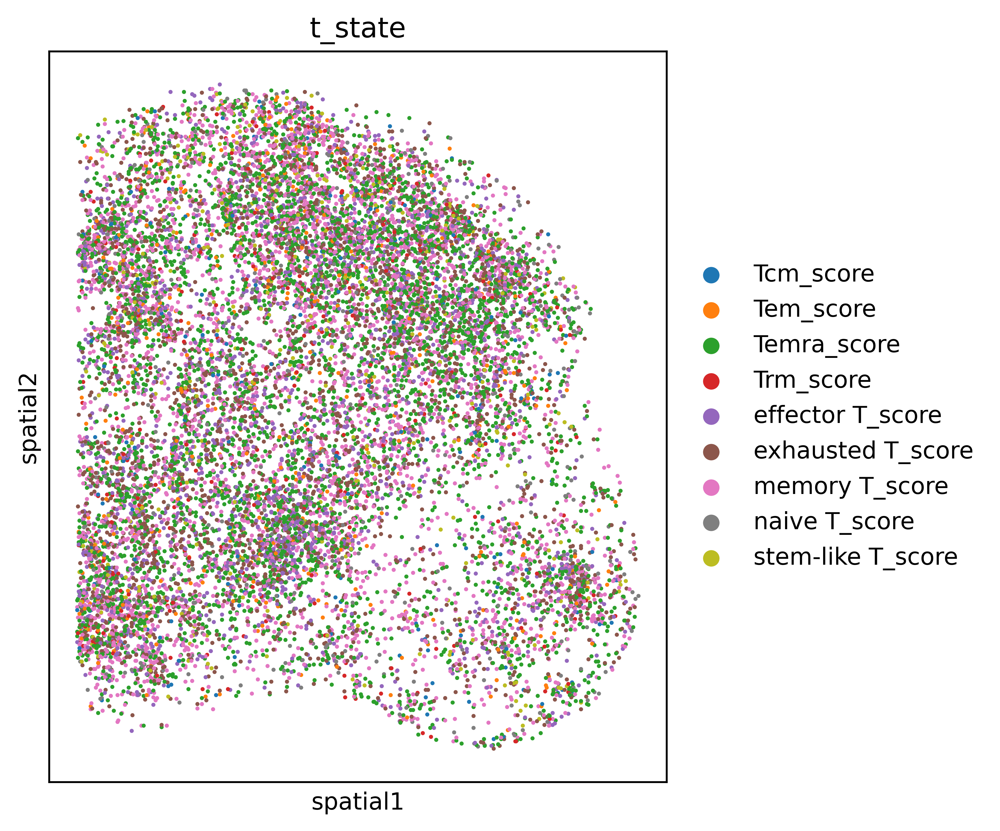

In [187]:
ddata = rnadata[rnadata.obs["t_state"] != "no T"].copy()
sq.pl.spatial_scatter(ddata, color="t_state", shape=None, size=2, library_id="spatial")

In [182]:
fdata.obs["spatial"] = [tuple([array[0], array[1]]) for array in fdata.obsm["spatial"]]
spac_df = fdata[fdata.obs["time_point"] == "3"].obs[["cluster_cellcharter_givenk", "spatial"]]

spac_dict = dict(zip(spac_df['spatial'], spac_df["cluster_cellcharter_givenk"]))

ddata.obs["spatial"] = [tuple([array[0] // 200 * 200, array[1] // 200 * 200]) for array in ddata.obsm["spatial"]]
ddata.obs["cluster"] = ddata.obs["spatial"].map(spac_dict)

In [183]:
ddata = ddata[~np.isnan(ddata.obs["cluster"])]

In [184]:
ddata.obs["cluster"] = ddata.obs["cluster"].astype(int)

/tmp/ipykernel_63655/626786207.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ddata.obs["cluster"] = ddata.obs["cluster"].astype(int)


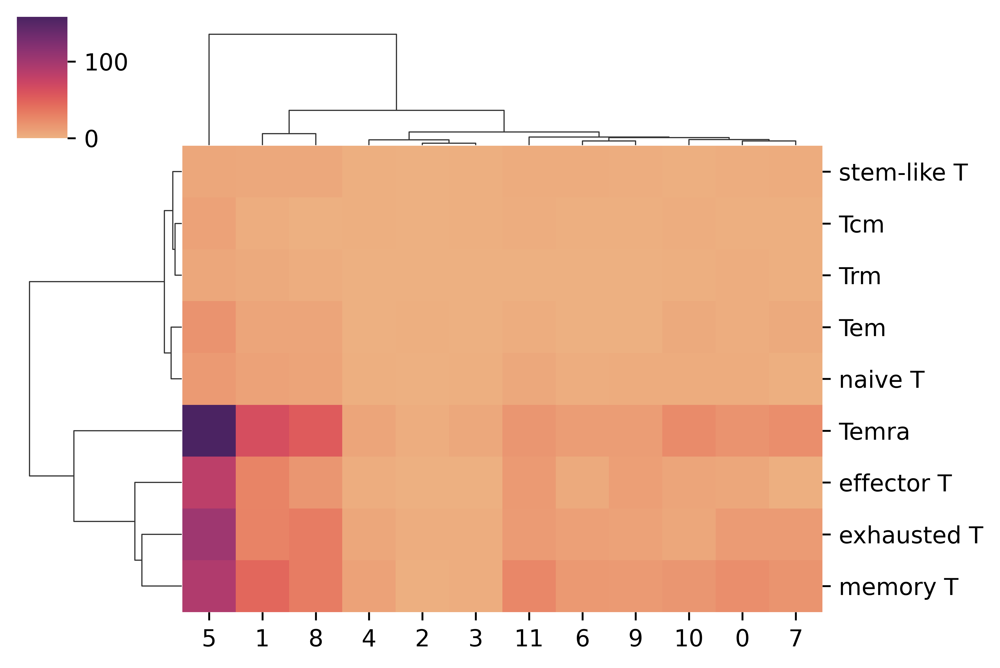

In [185]:
c_df = pd.DataFrame(ddata.obs[["cluster", "t_state"]].groupby("cluster").value_counts())
t_df = pd.DataFrame(np.array(c_df.sort_values(by=["cluster", "t_state"])).reshape(12, 9))
t_df.columns = ["Tcm", "Tem", "Temra", "Trm", "effector T", "exhausted T", "memory T", "naive T", "stem-like T"]
t_df.index = range(12)
sns.clustermap(t_df.T, cmap="flare", figsize=(6, 4))
plt.show()

In [127]:
ddata.obs["spatial"] = 0

In [128]:
ddata.write_h5ad("./gRNA/Day10-T.h5")

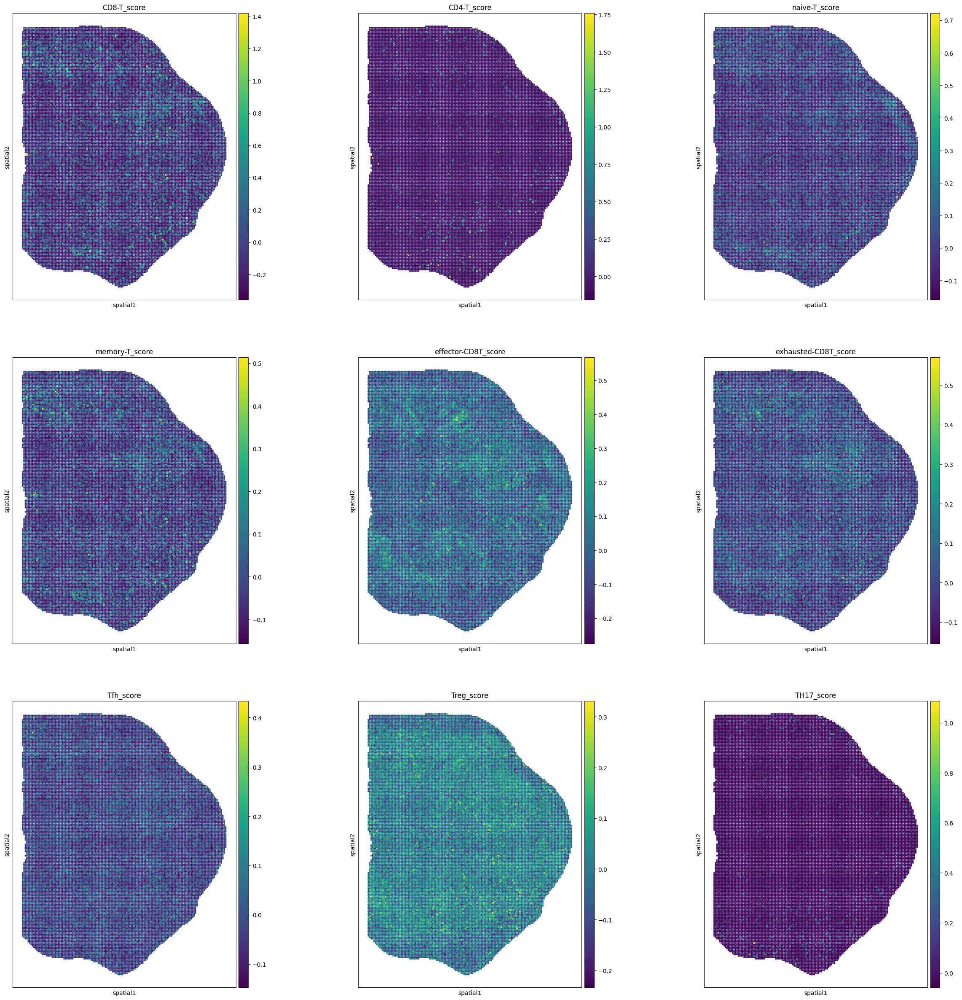

In [48]:
fig, ax = plt.subplots(3, 3, figsize=(30, 30))
i = 0
for path, genes in T_marker.items():
    sq.pl.spatial_scatter(bin20data, color=f"{path}_score", size=2, shape=None, library_id="spatial", ax=ax[i // 3][i % 3])
    i += 1

In [61]:
corr = []
p = []
score = fdata.obs["exhausted-CD8T_score"]
for ig, guide in enumerate(cdata.var_names):
    guide_vec = cdata[:, guide].X.toarray().flatten()
    pear = pearsonr(score, guide_vec)
    corr.append(pear[0])
    p.append(pear[1])

In [75]:
cdata.var_names[(np.array(p) < 0.001) & (np.abs(np.array(corr)) > 0.03)]

Index(['sgCxcl16'], dtype='object')

In [77]:
corr = []
p = []
score = fdata.obs["exhausted-CD8T_score"]
for ig, guide in enumerate(cdata.var_names):
    guide_vec = cdata[:, guide].X.toarray().flatten()
    pear = spearmanr(score, guide_vec)
    corr.append(pear[0])
    p.append(pear[1])

In [83]:
cdata.var_names[(np.array(p) < 0.001) & (np.abs(np.array(corr)) > 0.08)]

Index(['sgZc3h12a'], dtype='object')

# Cluster score average

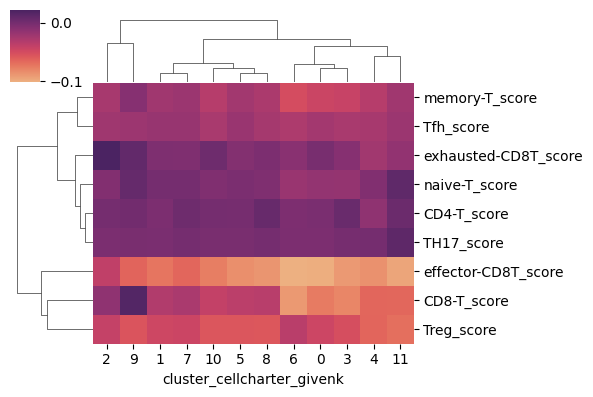

In [112]:
clusters = np.unique(fdata[fdata.obs["time_point"] == "3"].obs["cluster_cellcharter_givenk"])
score_df = fdata[fdata.obs["time_point"] == "3"].obs[[f"{path}_score" for path in T_marker] + ["cluster_cellcharter_givenk"]].groupby("cluster_cellcharter_givenk", observed=False).mean().T
sns.clustermap(score_df, cmap="flare", figsize=(6, 4))

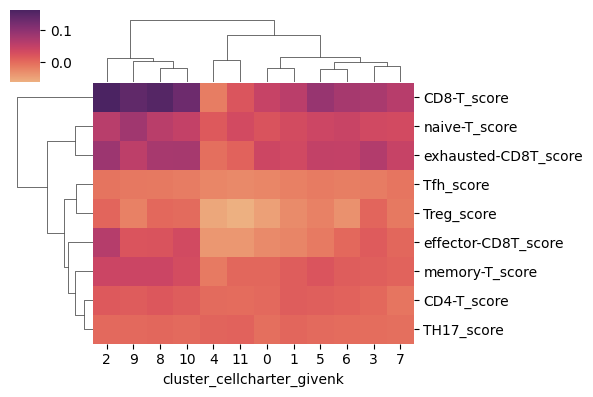

In [113]:
clusters = np.unique(fdata[fdata.obs["time_point"] == "2"].obs["cluster_cellcharter_givenk"])
score_df = fdata[fdata.obs["time_point"] == "2"].obs[[f"{path}_score" for path in T_marker] + ["cluster_cellcharter_givenk"]].groupby("cluster_cellcharter_givenk", observed=False).mean().T
sns.clustermap(score_df, cmap="flare", figsize=(6, 4))

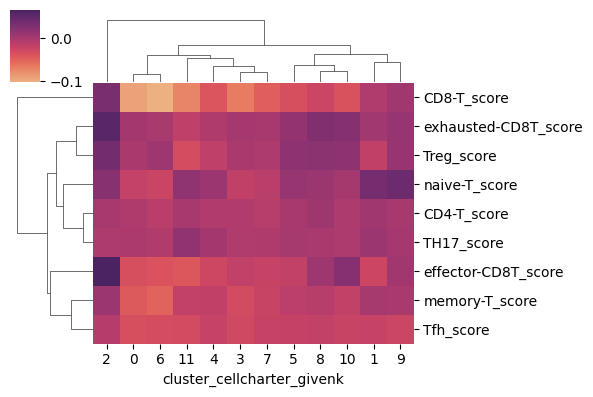

In [114]:
clusters = np.unique(fdata[fdata.obs["time_point"] == "1"].obs["cluster_cellcharter_givenk"])
score_df = fdata[fdata.obs["time_point"] == "1"].obs[[f"{path}_score" for path in T_marker] + ["cluster_cellcharter_givenk"]].groupby("cluster_cellcharter_givenk", observed=False).mean().T
sns.clustermap(score_df, cmap="flare", figsize=(6, 4))

# mean score in cluster

In [195]:
fdata.obs["spatial"] = [tuple([array[0], array[1]]) for array in fdata.obsm["spatial"]]
spac_df = fdata[fdata.obs["time_point"] == "2"].obs[["cluster_cellcharter_givenk", "spatial"]]

spac_dict = dict(zip(spac_df['spatial'], spac_df["cluster_cellcharter_givenk"]))

rnadata.obs["spatial"] = [tuple([array[0] // 200 * 200, array[1] // 200 * 200]) for array in rnadata.obsm["spatial"]]
rnadata.obs["cluster"] = rnadata.obs["spatial"].map(spac_dict)

In [196]:
rnadata.obs.columns != "spatial"

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True])

In [199]:
rnadata.obs

,naive T_score,memory T_score,Tcm_score,Tem_score,Trm_score,Temra_score,effector T_score,exhausted T_score,stem-like T_score,spatial,cluster,t_state
258071,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(5600, 400)",6.0,no T
163107,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(3600, 600)",6.0,no T
171176,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,"(3800, 600)",6.0,no T
125484,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(2800, 800)",3.0,no T
161327,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,"(3600, 800)",6.0,no T
...,...,...,...,...,...,...,...,...,...,...,...,...
93199,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(2000, 200)",NaN,no T
104847,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(2200, 200)",NaN,no T
18862,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(400, 800)",NaN,no T
9282,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(200, 6400)",NaN,no T


In [200]:
clusters = np.unique(fdata[fdata.obs["time_point"] == "2"].obs["cluster_cellcharter_givenk"])
t_df = rnadata.obs.loc[:, ~(np.isin(rnadata.obs.columns, ["spatial", "t_state"]))].groupby("cluster").mean()

In [212]:
t_df.index = t_df.index.astype("int")
t_df.columns = t_df.columns.str.rstrip("_score")

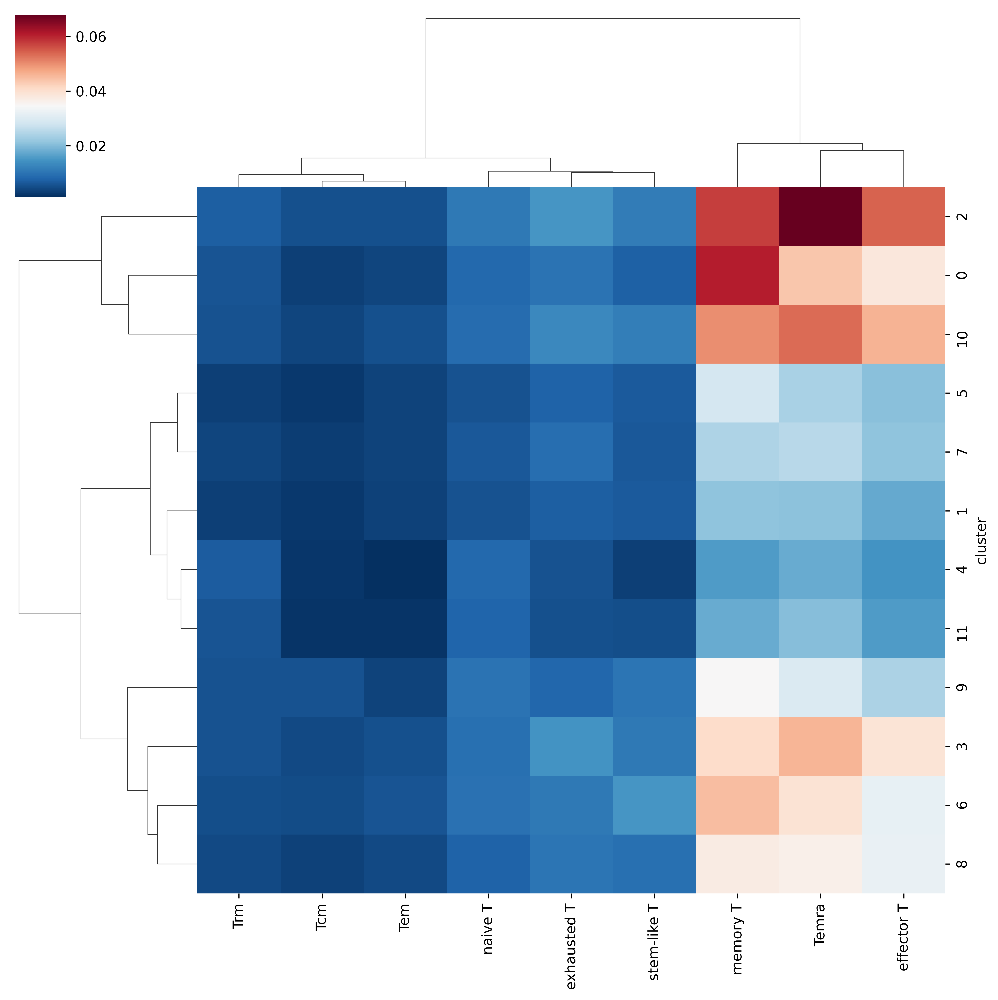

In [213]:
sns.clustermap(t_df, cmap="RdBu_r")

In [215]:
t_df.sum(axis=1)

cluster
0     0.181532
1     0.088288
2     0.234617
3     0.176098
4     0.076496
5     0.103075
6     0.167501
7     0.103407
8     0.146225
9     0.131768
10    0.198363
11    0.082576
dtype: float64

In [221]:
t_df.T

cluster,0,1,2,3,4,5,6,7,8,9,10,11
naive T,0.008486,0.005579,0.010866,0.009397,0.008587,0.005657,0.009788,0.006483,0.007632,0.010013,0.009033,0.007887
memory T,0.060707,0.021175,0.057612,0.040685,0.015671,0.028707,0.044684,0.024270,0.037266,0.034592,0.049886,0.017748
Tcm,0.003274,0.002616,0.005453,0.004704,0.002301,0.002554,0.004978,0.002913,0.003605,0.005591,0.004145,0.002125
Tem,0.003950,0.003561,0.005285,0.005393,0.001348,0.003757,0.005784,0.003863,0.004511,0.003750,0.005458,0.002125
Trm,0.005802,0.003257,0.007165,0.005591,0.006882,0.003343,0.005095,0.003956,0.004570,0.005758,0.005684,0.006009
Temra,0.043689,0.020860,0.067756,0.045851,0.017862,0.023914,0.039356,0.025363,0.036546,0.029648,0.053346,0.020523
effector T,0.038212,0.017532,0.054157,0.039002,0.014728,0.020678,0.031957,0.021122,0.032146,0.023962,0.045994,0.015644
exhausted T,0.009983,0.007071,0.014925,0.014670,0.005698,0.007762,0.010785,0.009135,0.010333,0.008166,0.013200,0.005463
stem-like T,0.007428,0.006638,0.011398,0.010804,0.003419,0.006703,0.015074,0.006301,0.009616,0.010288,0.011618,0.005051


In [222]:
totals = t_df.sum(axis=1)

percentages = t_df.T.div(totals) * 100

ax = percentages.T.plot(kind='bar', stacked=True, figsize=(20, 12))

for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', label_type='center')

plt.title('Distribution of guide count')
plt.xlabel('Guide')
plt.ylabel('Percentage')
plt.legend(title='Parts')
plt.show()